In [2]:
import math
import cv2
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
DEBUG = False

In [2]:
def consecutive(data, stepsize=1):
    return np.split(data, np.where(np.diff(data) > stepsize)[0]+1)

In [3]:
def find2largest(idx, line):
    result = []
    
    # Calculate mean and separate the ink from the page.
    df = pd.DataFrame(line, columns=['R','G','B'])
    df['mean'] = df.mean(axis=1)
    df['ink'] = df['mean'].apply(lambda x: 1 if x < 255 else 0)
    df['idx'] = df.index

    # Group the inked pixels and pick 2 largest.
    groups = consecutive(list(df.groupby('ink').get_group(1)['idx']))
    df_groups = pd.DataFrame([[g, len(g)] for g in groups], columns=['set', 'size'])
    df_groups = df_groups.sort_values(by=['size'], ascending=False).iloc[0:2]
    
    # Only process if found 2 largest.
    if df_groups.size >= 4:
        result = sorted([df_groups.iloc[0][0][0], df_groups.iloc[0][0][-1], df_groups.iloc[1][0][0], df_groups.iloc[1][0][-1]])

    return result

In [4]:
# Input param is a list of [LineLength, FirstGroup, LastGroup].
def getangle(lengthPlusGroups):
    length, firstGroup, lastGroup = lengthPlusGroups
    angle = []
    for n in range(0, len(firstGroup)):
        first = firstGroup[n]
        last = lastGroup[n]
        delta = abs(first-last)
        direction = -1 if first < last else 1
        print("length:{}, first:{}, last:{}, delta:{}, direction:{}".format(length, first, last, delta, direction)) if DEBUG else None
        angle.append(direction*math.asin(delta/length)*180/math.pi) if delta < length else None
    return np.mean(angle)

In [127]:
pixelstep = 2
iterations = 40

vertical = {}
horizontal = {}

for f in range(1, 70):
    filename = "john{:04d}.jpg".format(f)
    filepath = "1.cropped/{}".format(filename)
    img = cv2.imread(filepath)
    
    vertical[f] = []
    horizontal[f] = []

    print(filename)
    
    for n in range(1, iterations):

        # Calculate crop size.
        offset = n + pixelstep
        x = int(offset / 2)
        y = int(offset / 2)
        width = 2200 - x
        height = 3300 - y

        cropped = img[y:y+height, x:x+width]
        
        # Get vertical lines.
        first = find2largest(f, cropped[0])
        last = find2largest(f, cropped[-1])
        if len(first) > 0 and len(first) == len(last):
            vertical[f].append([height, first, last])
        
        # Get horizontal lines.
        first = find2largest(f, cropped[:, 0])
        last = find2largest(f, cropped[:, -1])
        if len(first) > 0 and len(first) == len(last):
            horizontal[f].append([width, first, last])

john0001.jpg
john0002.jpg
john0003.jpg
john0004.jpg
john0005.jpg
john0006.jpg
john0007.jpg
john0008.jpg
john0009.jpg
john0010.jpg
john0011.jpg
john0012.jpg
john0013.jpg
john0014.jpg
john0015.jpg
john0016.jpg
john0017.jpg
john0018.jpg
john0019.jpg
john0020.jpg
john0021.jpg
john0022.jpg
john0023.jpg
john0024.jpg
john0025.jpg
john0026.jpg
john0027.jpg
john0028.jpg
john0029.jpg
john0030.jpg
john0031.jpg
john0032.jpg
john0033.jpg
john0034.jpg
john0035.jpg
john0036.jpg
john0037.jpg
john0038.jpg
john0039.jpg
john0040.jpg
john0041.jpg
john0042.jpg
john0043.jpg
john0044.jpg
john0045.jpg
john0046.jpg
john0047.jpg
john0048.jpg
john0049.jpg
john0050.jpg
john0051.jpg
john0052.jpg
john0053.jpg
john0054.jpg
john0055.jpg
john0056.jpg
john0057.jpg
john0058.jpg
john0059.jpg
john0060.jpg
john0061.jpg
john0062.jpg
john0063.jpg
john0064.jpg
john0065.jpg
john0066.jpg
john0067.jpg
john0068.jpg
john0069.jpg


In [224]:
getangle(vertical[2][0])

3299 286 238 48 1
3299 307 271 36 1
3299 1950 1902 48 1
3299 1983 1930 53 1


0.8032801516333021

In [229]:
getangle(horizontal[2][0])

2199 265 286 21 -1
2199 287 303 16 -1
2199 3054 3070 16 -1
2199 3071 3086 15 -1


-0.44294612768208863

In [3]:
def rotate_image(img, angle):
    (h, w) = img.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(img.copy(), M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

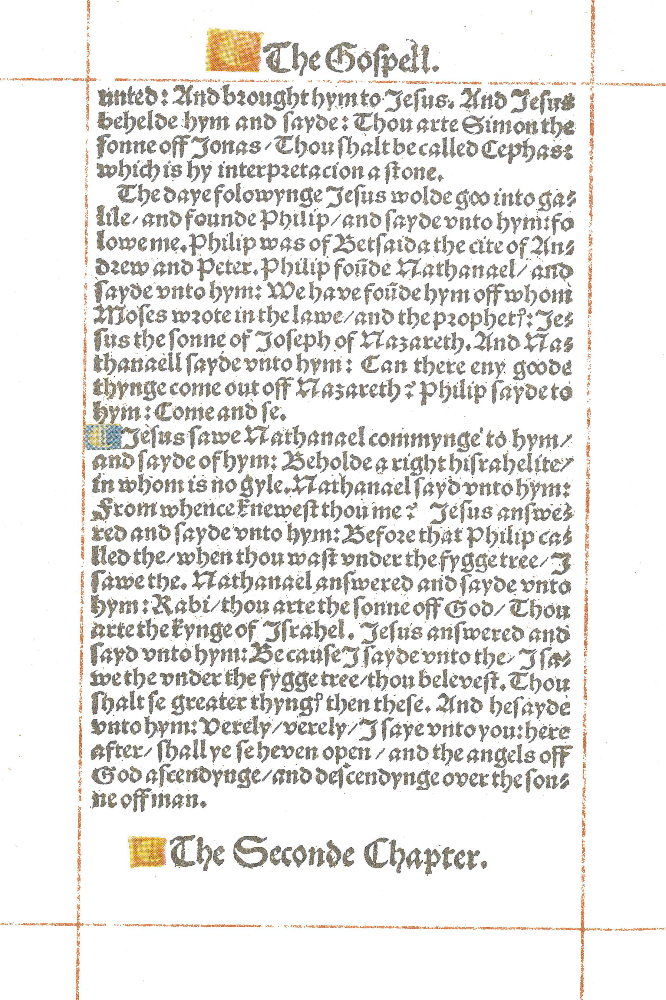

In [22]:
img = cv2.imread("1.cropped/john0004.jpg")
Image.fromarray(img)

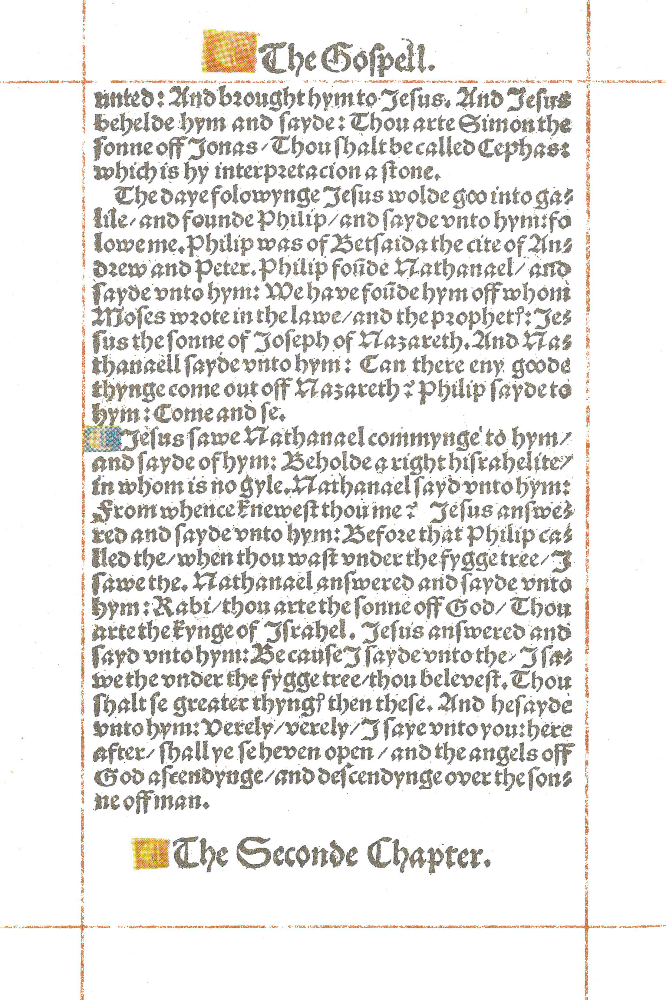

In [23]:
rotated = rotate_image(img.copy(), 0.5320537178252351)
Image.fromarray(rotated)

In [247]:
v_or_h = horizontal
for f in range(1, 70):
    filename = "john{:04d}.jpg".format(f)
    inpath = "1.cropped/{}".format(filename)
    outpath = "4.rotated/{}".format(filename)
    img = cv2.imread(inpath)
    angle = getangle(v_or_h[f][0]) if v_or_h[f] and v_or_h[f][0] else 0
    rotated = rotate_image(img.copy(), angle)
    y = Image.fromarray(rotated)
    y.save(outpath)
    print(outpath)

3.rotated/john0001.jpg
3.rotated/john0002.jpg
3.rotated/john0003.jpg
3.rotated/john0004.jpg
3.rotated/john0005.jpg
3.rotated/john0006.jpg
3.rotated/john0007.jpg
3.rotated/john0008.jpg
3.rotated/john0009.jpg
3.rotated/john0010.jpg
3.rotated/john0011.jpg
3.rotated/john0012.jpg
3.rotated/john0013.jpg
3.rotated/john0014.jpg
3.rotated/john0015.jpg
3.rotated/john0016.jpg
3.rotated/john0017.jpg
3.rotated/john0018.jpg
3.rotated/john0019.jpg
3.rotated/john0020.jpg
3.rotated/john0021.jpg
3.rotated/john0022.jpg
3.rotated/john0023.jpg
3.rotated/john0024.jpg
3.rotated/john0025.jpg
3.rotated/john0026.jpg
3.rotated/john0027.jpg
3.rotated/john0028.jpg
3.rotated/john0029.jpg
3.rotated/john0030.jpg
3.rotated/john0031.jpg
3.rotated/john0032.jpg
3.rotated/john0033.jpg
3.rotated/john0034.jpg
3.rotated/john0035.jpg
3.rotated/john0036.jpg
3.rotated/john0037.jpg
3.rotated/john0038.jpg
3.rotated/john0039.jpg
3.rotated/john0040.jpg
3.rotated/john0041.jpg
3.rotated/john0042.jpg
3.rotated/john0043.jpg
3.rotated/j